In [6]:
import os
os.environ['CUDA_VISIBLE_DEVICES']='1'

from fastai import *
from fastai.vision import *
from superRes.generators import *
from superRes.critics import *
from superRes.dataset import *
from superRes.loss import *
from superRes.save import *
from superRes.fid_loss import *
from superRes.ssim import *
# from PIL import Image, ImageDraw, ImageFont
# from PIL import ImageFile
from pathlib import Path

import torchvision
import geffnet # efficient/ mobile net

In [7]:
path = Path('./dataset/')

path_fullRes = path/'DIV2K_train_HR'

path_lowRes_256 = path/'DIV2K_train_LR_256_QF20'
path_lowRes_512 = path/'DIV2K_train_LR_512_QF20'
path_lowRes_Full = path/'DIV2K_train_LR_Full_QF20'

In [8]:
def plot_patched_image(p):
    _, axs = plt.subplots(p.shape[0], p.shape[1], figsize=(10, 10))
    for i in range(p.shape[0]):
        for j in range(p.shape[1]):
            Image(p[i][j]).show(ax=axs[i, j])

def get_patches(tensor):
    pw, ph = 32, 32
    nc, w, h = tensor.shape
    padW = pw - w%pw
    padH = ph - h%ph
    paded = F.pad(tensor, (padH, 0, padW, 0), value=1)
    patches = paded.unfold(0, nc, nc).unfold(1, ph, ph).unfold(2, pw, pw)
    return patches

In [9]:
high_res = ImageList.from_folder(path_fullRes, presort=True)
low_res  = ImageList.from_folder(path_lowRes_Full, presort=True)

In [10]:
print(low_res[10].shape)
print(high_res[10].shape)

torch.Size([3, 1356, 2040])
torch.Size([3, 1356, 2040])


In [7]:
index = 6
resizedImg = low_res[index].resize(high_res[index].shape).clone()

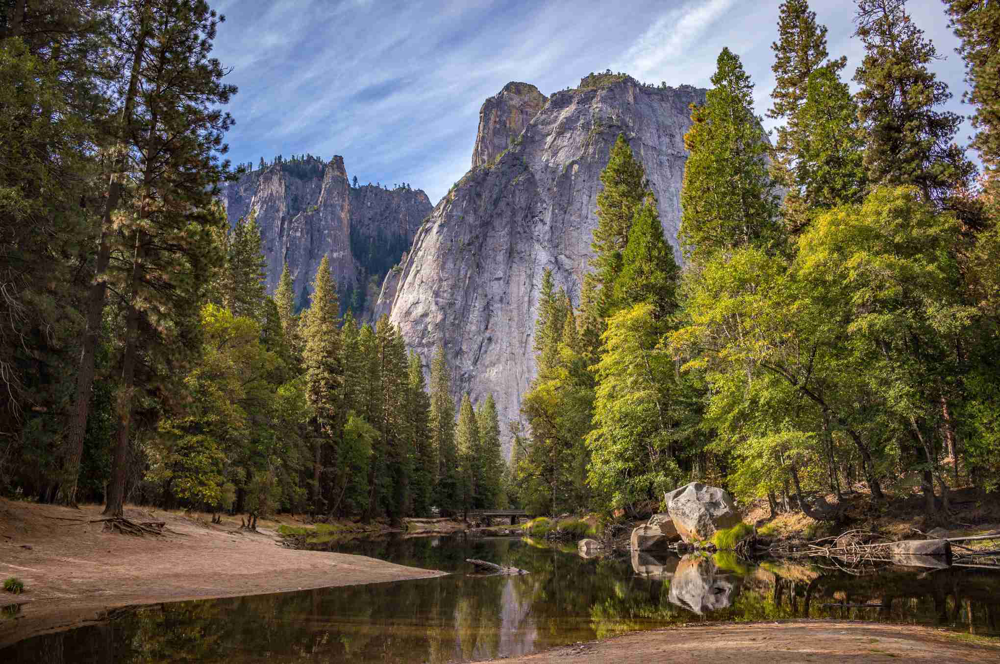

In [8]:
resizedImg

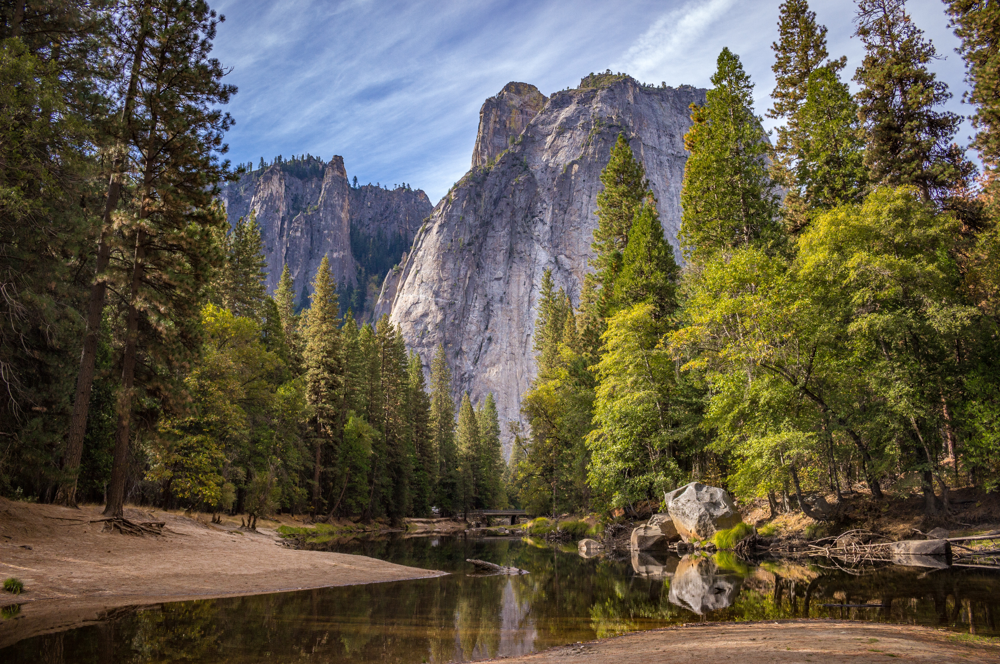

In [10]:
high_res[index]

In [11]:
resizedImg.shape == high_res[index].shape

True

torch.Size([43, 64, 3, 32, 32])


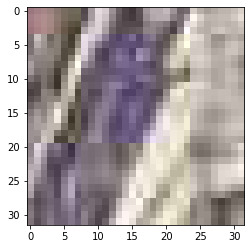

In [17]:
patch_img = get_patches(resizedImg.data)[0]
print(patch_img.shape)
plt.imshow(patch_img[17][26].permute(1, 2, 0), interpolation='nearest')
# plot_patched_image(patch_img)

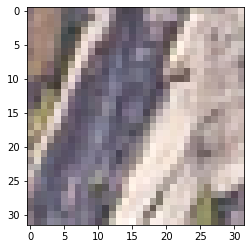

In [16]:
patch_img = get_patches(high_res[index].data)[0]
patch_img[4][2].shape
plt.imshow(patch_img[17][26].permute(1, 2, 0), interpolation='nearest')
# plot_patched_image(patch_img)

In [18]:
# row x col
patch_img.shape[:2]

torch.Size([43, 64])

In [20]:
testHR = path/"Test_patches"
testHR.mkdir(parents=True, exist_ok=True)

testImg = Image(patch_img[4][2])
testImg.save(testHR/'test.jpg')

In [21]:
testList = high_res[:2]
for index, img in enumerate(testList):
    file_name = str(index+1).zfill(3)
    patches = get_patches(img.data)[0]
    row, col = patches.shape[:2]
    for i in range(row):
        for j in range(col):
            tempImg = Image(patches[i][j])
            fn = file_name + f'_patch_{i}_{j}.jpg'
            tempImg.save(testHR/fn)

In [3]:
destHR = path/"DIV2K_train_HR_Patches"/"32px_FullQF20"
destHR.mkdir(parents=True, exist_ok=True)

In [11]:
destLR = path/"DIV2K_train_LR_Patches"/"32px_FullQF20"
destLR.mkdir(parents=True, exist_ok=True)

### HR patches & LR patches

In [ ]:
for index, img in enumerate(high_res):
    file_name = str(index+1).zfill(3)
    print("Creating file: " + file_name)
    patches = get_patches(img.data)[0]
    row, col = patches.shape[:2]
    for i in range(row):
        for j in range(col):
            tempImg = Image(patches[i][j])
            fn = file_name + f'_patch_{i}_{j}.png'
            tempImg.save(destHR/fn)
            
for index, img in enumerate(low_res):
    file_name = str(index+1).zfill(3)
    print("Creating file: " + file_name)
    resizedImg = img.resize(high_res[index].shape).clone()
    patches = get_patches(resizedImg.data)[0]
    row, col = patches.shape[:2]
    for i in range(row):
        for j in range(col):
            tempImg = Image(patches[i][j])
            fn = file_name + f'_patch_{i}_{j}.png'
            tempImg.save(destLR/fn)

Creating file: 001
Creating file: 002
Creating file: 003
Creating file: 004
Creating file: 005
Creating file: 006
Creating file: 007
Creating file: 008
Creating file: 009
Creating file: 010
Creating file: 011
Creating file: 012
Creating file: 013
Creating file: 014
Creating file: 015
Creating file: 016
Creating file: 017
Creating file: 018
Creating file: 019
Creating file: 020
Creating file: 021
Creating file: 022
Creating file: 023
Creating file: 024
Creating file: 025
Creating file: 026
Creating file: 027
Creating file: 028
Creating file: 029
Creating file: 030
Creating file: 031
Creating file: 032
Creating file: 033
Creating file: 034
Creating file: 035
Creating file: 036
Creating file: 037
Creating file: 038
Creating file: 039
Creating file: 040
Creating file: 041
Creating file: 042
Creating file: 043
Creating file: 044
Creating file: 045
Creating file: 046
Creating file: 047
Creating file: 048
Creating file: 049
Creating file: 050
Creating file: 051
Creating file: 052
Creating fil

Creating file: 433
Creating file: 434
Creating file: 435
Creating file: 436
Creating file: 437
Creating file: 438
Creating file: 439
Creating file: 440
Creating file: 441
Creating file: 442
Creating file: 443
Creating file: 444
Creating file: 445
Creating file: 446
Creating file: 447
Creating file: 448
Creating file: 449
Creating file: 450
Creating file: 451
Creating file: 452
Creating file: 453
Creating file: 454
Creating file: 455
Creating file: 456
Creating file: 457
Creating file: 458
Creating file: 459
Creating file: 460
Creating file: 461
Creating file: 462
Creating file: 463
Creating file: 464
Creating file: 465
Creating file: 466
Creating file: 467
Creating file: 468
Creating file: 469
Creating file: 470
Creating file: 471
Creating file: 472
Creating file: 473
Creating file: 474
Creating file: 475
Creating file: 476
Creating file: 477
Creating file: 478
Creating file: 479
Creating file: 480
Creating file: 481
Creating file: 482
Creating file: 483
Creating file: 484
Creating fil

Creating file: 865
Creating file: 866
Creating file: 867
Creating file: 868
Creating file: 869
Creating file: 870
Creating file: 871
Creating file: 872
Creating file: 873
Creating file: 874
Creating file: 875
Creating file: 876
Creating file: 877
Creating file: 878
Creating file: 879
Creating file: 880
Creating file: 881
Creating file: 882
Creating file: 883
Creating file: 884
Creating file: 885
Creating file: 886
Creating file: 887
Creating file: 888
Creating file: 889
Creating file: 890
Creating file: 891
Creating file: 892
Creating file: 893
Creating file: 894
Creating file: 895
Creating file: 896
Creating file: 897
Creating file: 898
Creating file: 899
Creating file: 900
Creating file: 001
Creating file: 002
Creating file: 003
Creating file: 004
Creating file: 005
Creating file: 006
Creating file: 007
Creating file: 008
Creating file: 009
Creating file: 010
Creating file: 011
Creating file: 012
Creating file: 013
Creating file: 014
Creating file: 015
Creating file: 016
Creating fil

Creating file: 397
Creating file: 398
Creating file: 399
Creating file: 400
Creating file: 401
Creating file: 402
Creating file: 403
Creating file: 404
Creating file: 405
Creating file: 406
Creating file: 407
Creating file: 408
Creating file: 409
Creating file: 410
Creating file: 411
Creating file: 412
Creating file: 413
Creating file: 414
Creating file: 415
Creating file: 416
Creating file: 417
Creating file: 418
Creating file: 419
Creating file: 420
Creating file: 421
Creating file: 422
Creating file: 423
Creating file: 424
Creating file: 425
Creating file: 426
Creating file: 427
Creating file: 428
Creating file: 429


In [24]:
for index, img in enumerate(low_res):
    file_name = str(index+1).zfill(3)
    print("Creating file: " + file_name)
    resizedImg = img.resize(high_res[index].shape).clone()
    patches = get_patches(resizedImg.data)[0]
    row, col = patches.shape[:2]
    for i in range(row):
        for j in range(col):
            tempImg = Image(patches[i][j])
            fn = file_name + f'_patch_{i}_{j}.png'
            tempImg.save(destLR/fn)

Creating file: 001
Creating file: 002
Creating file: 003
Creating file: 004
Creating file: 005
Creating file: 006
Creating file: 007
Creating file: 008
Creating file: 009
Creating file: 010
Creating file: 011
Creating file: 012
Creating file: 013
Creating file: 014
Creating file: 015
Creating file: 016
Creating file: 017
Creating file: 018
Creating file: 019
Creating file: 020
Creating file: 021
Creating file: 022
Creating file: 023
Creating file: 024
Creating file: 025
Creating file: 026
Creating file: 027
Creating file: 028
Creating file: 029
Creating file: 030
Creating file: 031
Creating file: 032
Creating file: 033
Creating file: 034
Creating file: 035
Creating file: 036
Creating file: 037
Creating file: 038
Creating file: 039
Creating file: 040
Creating file: 041
Creating file: 042
Creating file: 043
Creating file: 044
Creating file: 045
Creating file: 046
Creating file: 047
Creating file: 048
Creating file: 049
Creating file: 050
Creating file: 051
Creating file: 052
Creating fil

Creating file: 433
Creating file: 434
Creating file: 435
Creating file: 436
Creating file: 437
Creating file: 438
Creating file: 439
Creating file: 440
Creating file: 441
Creating file: 442
Creating file: 443
Creating file: 444
Creating file: 445
Creating file: 446
Creating file: 447
Creating file: 448
Creating file: 449
Creating file: 450
Creating file: 451
Creating file: 452
Creating file: 453
Creating file: 454
Creating file: 455
Creating file: 456
Creating file: 457
Creating file: 458
Creating file: 459
Creating file: 460
Creating file: 461
Creating file: 462
Creating file: 463
Creating file: 464
Creating file: 465
Creating file: 466
Creating file: 467
Creating file: 468
Creating file: 469
Creating file: 470
Creating file: 471
Creating file: 472
Creating file: 473
Creating file: 474
Creating file: 475
Creating file: 476
Creating file: 477
Creating file: 478
Creating file: 479
Creating file: 480
Creating file: 481
Creating file: 482
Creating file: 483
Creating file: 484
Creating fil

Creating file: 865
Creating file: 866
Creating file: 867
Creating file: 868
Creating file: 869
Creating file: 870
Creating file: 871
Creating file: 872
Creating file: 873
Creating file: 874
Creating file: 875
Creating file: 876
Creating file: 877
Creating file: 878
Creating file: 879
Creating file: 880
Creating file: 881
Creating file: 882
Creating file: 883
Creating file: 884
Creating file: 885
Creating file: 886
Creating file: 887
Creating file: 888
Creating file: 889
Creating file: 890
Creating file: 891
Creating file: 892
Creating file: 893
Creating file: 894
Creating file: 895
Creating file: 896
Creating file: 897
Creating file: 898
Creating file: 899
Creating file: 900


In [ ]:
print(len(destHR.ls()))
print(len(destLR.ls()))